<a href="https://colab.research.google.com/github/Fibonacci1664/Pix2Pix/blob/main/MyPix2Pix_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://machinelearningmastery.com/how-to-implement-pix2pix-gan-models-from-scratch-with-keras/

https://www.tensorflow.org/tutorials/generative/pix2pix

# **IMPORTS**

In [ ]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras import Input
from keras.layers import Conv2D
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import BatchNormalization
from keras.utils.vis_utils import plot_model
from keras.layers import Conv2DTranspose
from keras.layers import Dropout

import numpy as np

# create an instance of the VGG-16 model
vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet')

print(tf.__version__)

2.9.2


# **TEST DMI CODE - TEMP**

In [ ]:
# pass d1 to vgg-16 here
# create an instance of the VGG-16 model
vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet')

# Load the style image
# style_image = tf.io.read_file('stylized_chest.jpg')
# style_image = tf.image.decode_jpeg(style_image, channels=3)

# print(style_image.shape)

# plt.figure()
# plt.imshow(style_image)

# **TESTING SHELL SCRIPTS - TEMP**

In [ ]:
# %%writefile simple_shell_script.sh

# echo "This is a shell script"

# **LOAD DATA - ORIGINAL**

In [ ]:
# dataset_name = "edges2shoes"

# _URL = f'http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/{dataset_name}.tar.gz'


# path_to_zip = tf.keras.utils.get_file(
#     fname=f"{dataset_name}.tar.gz",
#     origin=_URL,
#     extract=True)

# path_to_zip  = pathlib.Path(path_to_zip)

# PATH = path_to_zip.parent/dataset_name

# list(PATH.parent.iterdir())

# # Each original image is of size 256 x 512, which in and of itself contains two 256 x 256 images
# # Print out a smaple image to ensure the dataset has loaded correctly
# sample_image = tf.io.read_file(str(PATH / 'train/10000_AB.jpg'))
# sample_image = tf.io.decode_jpeg(sample_image)
# print(sample_image.shape)

# plt.figure()
# plt.imshow(sample_image)

# **LOAD TU-BERLIN SKETCH DATASET**

In [ ]:
# import os

# # Download the TU-Berlin Sketch dataset
# dataset_name = "TU-Berlin Sketch dataset"
# _URL = "https://cybertron.cg.tu-berlin.de/eitz/tvcg_benchmark/imagedb_100k.tar"
# path_to_zip = tf.keras.utils.get_file(fname=f"{dataset_name}.tgz", origin=_URL, extract=True)
# path_to_zip = pathlib.Path(path_to_zip)

# # Define the path to the dataset
# PATH = path_to_zip.parent/'BSR'/'BSDS500'/'data'/'images'

# # Print out a list of the files in the dataset
# list(PATH.iterdir())

# # Get the list of all files in the train directory
# train_files = os.listdir(PATH / 'train')
# print(train_files)

# # Print out a sample image to ensure the dataset has loaded correctly
# sample_image = tf.io.read_file(str(PATH / 'train' / train_files[3]))
# sample_image = tf.io.decode_jpeg(sample_image)
# print(sample_image.shape)

# plt.figure()
# plt.imshow(sample_image)


# **LOAD QUICKDRAW DATASET**

In [ ]:
# !gsutil -m cp 'gs://quickdraw_dataset/full/simplified/apple.ndjson' .

# import json
# import matplotlib.pyplot as plt
# from PIL import Image
# from PIL import Image, ImageDraw

# with open('apple.ndjson', 'r') as f:
#     data = [json.loads(line) for line in f]

# first_image_data = data[1]['drawing']
# print(first_image_data)

# # convert the data to a PIL image
# first_image = Image.new('RGB', (256, 256), (255, 255, 255))
# print(first_image)
# draw = ImageDraw.Draw(first_image)

# for data in first_image_data:
#     x, y = data
#     for i in range(len(x)):
#         #first_image.putpixel((x[i], y[i]), (0, 0, 0))
#         draw.line(list(zip(x, y)), fill='black', width=5)


# plt.imshow(first_image)
# plt.show()

# **LOAD SKETCH2POKEMON DATASET**

(256, 512, 3)


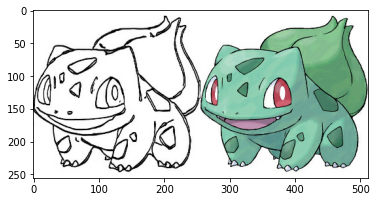

In [ ]:
input_file = '/content'

PATH = input_file

# Each original image is of size 256 x 512, which in and of itself contains two 256 x 256 images
# Print out a smaple image to ensure the dataset has loaded correctly
sample_image = tf.io.read_file(str(PATH+'/train/0.jpg'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

plt.figure()
plt.imshow(sample_image)

# **PREPROCESS DATA**

### **SPLIT IMAGES INTO TWO SEPARATE IMAGES, REAL/LABEL or TARGET/INPUT**

(256, 256, 3)


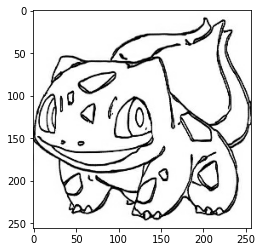

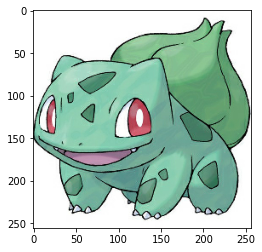

In [ ]:
# To separate real building facade images from the architecture label images — all of which will be of size 256 x 256.
# Define a function that loads image files and outputs two image tensors, these two images will be the 256 x 512 separated

def load(image_file):
    # Read and decode an image file to a uint8 tensor
    image = tf.io.read_file(image_file)
    image = tf.io.decode_jpeg(image)

    # Split each image tensor into two tensors:
    # - one with a real building facade image
    # - one with an architecture label image 
    w = tf.shape(image)[1]                # 512
    w = w // 2                            # 256
    sketch_image = image[:, :w, :]        # From start - 256
    real_image = image[:, w:, :]          # From 256 - end

    # Convert both images to float32 tensors
    sketch_image = tf.cast(sketch_image, tf.float32)
    real_image = tf.cast(real_image, tf.float32)

    return sketch_image, real_image

# Plot a sample of the input (sketch image) and real images
sketch, real = load(str(PATH+'/train/0.jpg'))

print(sketch.shape)

# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(sketch / 255.0)
plt.figure()
plt.imshow(real / 255.0)

### **HELPER FUNCTIONS TO AUGMENT DATA**

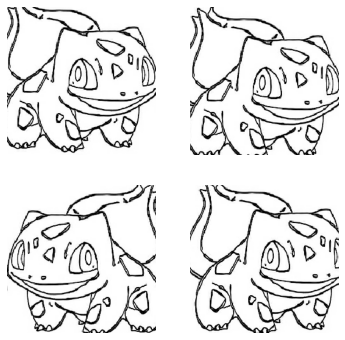

In [ ]:
# As described in the pix2pix paper, you need to apply random jittering and mirroring to preprocess the training set.

# Define several functions that:

# Resize each 256 x 256 image to a larger height and width—286 x 286.
# Randomly crop it back to 256 x 256.
# Randomly flip the image horizontally i.e. left to right (random mirroring).
# Normalize the images to the [-1, 1] range.

# The pokemon train set has 830 images
BUFFER_SIZE = 830
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

def resize(input_image, real_image, height, width):
    input_image = tf.image.resize(input_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.resize(real_image, [height, width], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return input_image, real_image

def random_crop(input_image, real_image):
    stacked_image = tf.stack([input_image, real_image], axis=0)
    cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

    return cropped_image[0], cropped_image[1]

# Normalizing the images to [-1, 1] using scaling normalization
def normalize_two(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    return input_image, real_image

# Normalizing the image to [-1, 1] using scaling normalization
def normalize_one(input_image):
    input_image = (input_image / 127.5) - 1

    return input_image

# Normalizing the images to [-1, 1] using channel-wise mean subtraction normalization
# This is important as this is what the vgg-16 network used to train on
# Something is not quite right with this as it's causing streaking type artefact across the generated images
def normalize_channel_wise_two(input_image, real_image):
    mean = tf.reduce_mean(input_image, axis=(1, 2), keepdims=True)
    std = tf.math.reduce_std(input_image, axis=(1, 2), keepdims=True)
    input_image = (input_image - mean) / std
    real_image = (real_image - mean) / std
    
    return input_image, real_image

# Normalizing a single image to [-1, 1] using channel-wise mean subtraction normalization
# This is important as this is what the vgg-16 network used to train on
def normalize_channel_wise_one(input_image):
    mean = tf.reduce_mean(input_image, axis=(1, 2), keepdims=True)
    std = tf.math.reduce_std(input_image, axis=(1, 2), keepdims=True)
    input_image = (input_image - mean) / std
    
    return input_image


@tf.function()
def random_jitter(input_image, real_image):
    # Resizing to 286x286
    input_image, real_image = resize(input_image, real_image, 286, 286)

    # Random cropping back to 256x256
    input_image, real_image = random_crop(input_image, real_image)

    if tf.random.uniform(()) > 0.5:
        # Random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)

    return input_image, real_image

# Inspect some of the preprocessed output
plt.figure(figsize=(6, 6))

for i in range(4):
    rand_jit_sketch, rand_jit_real = random_jitter(sketch, real)
    plt.subplot(2, 2, i + 1)
    plt.imshow(rand_jit_sketch / 255.0)
    plt.axis('off')

plt.show()

### **HELPER FUNCTIONS THAT LOAD AND PREPROCESS THE TRAIN/TEST SETS**

In [ ]:
# Helper functions that load and preprocess the training and test sets
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = random_jitter(input_image, real_image)
    input_image, real_image = normalize_two(input_image, real_image)
    #input_image, real_image = normalize_channel_wise_two(input_image, real_image)

    return input_image, real_image

def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = resize(input_image, real_image,
                                    IMG_HEIGHT, IMG_WIDTH)
    input_image, real_image = normalize_two(input_image, real_image)
    #input_image, real_image = normalize_channel_wise_two(input_image, real_image)

    return input_image, real_image

# **BUILD INPUT PIPELINE**

In [ ]:
# Build an input pipeline with tf.data
train_dataset = tf.data.Dataset.list_files(str(PATH+'/train/*.jpg'))
train_dataset = train_dataset.map(load_image_train, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

try:
    test_dataset = tf.data.Dataset.list_files(str(PATH+'/test/*.jpg'))
except tf.errors.InvalidArgumentError:
    test_dataset = tf.data.Dataset.list_files(str(PATH+'/val/*.jpg'))

test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

# **HELPER FUNCTION TO CALCULATE THE RECEPTIVE FIELD**

In [ ]:
# example of calculating the receptive field for the PatchGAN
# The receptive field is the relationship between one output activation of the model to an area on the input image

# calculate the effective receptive field size
def receptive_field(output_size, kernel_size, stride_size):
    return (output_size - 1) * stride_size + kernel_size

# output layer 1x1 pixel with 4x4 kernel and 1x1 stride
rf = receptive_field(1, 4, 1)
print(rf)
# second last layer with 4x4 kernel and 1x1 stride
rf = receptive_field(rf, 4, 1)
print(rf)
# 3 PatchGAN layers with 4x4 kernel and 2x2 stride
rf = receptive_field(rf, 4, 2)
print(rf)
rf = receptive_field(rf, 4, 2)
print(rf)
rf = receptive_field(rf, 4, 2)
print(rf)

4
7
16
34
70


# **DUAL MASK INJECTION**

In [ ]:
def dual_mask_injection(feat, mask, in_channels):

    # Reshaping was required to take care of broadcasting issues when
    # trying to carry out element-wise multiplication and element-wise addition
    #weight_a = tf.Variable(tf.ones((1, in_channels, 1, 1))*1.1)
    weight_a = tf.Variable(tf.ones((1, 1, 1, in_channels))*1.1)
    print("weight_a: ", weight_a)
    #weight_a = tf.reshape(weight_a, [1, 1, 1, in_channels])

    #weight_b = tf.Variable(tf.ones((1, in_channels, 1, 1))*0.9)
    weight_b = tf.Variable(tf.ones((1, 1, 1, in_channels))*0.9)
    print("weight_b: ", weight_b)
    #weight_b = tf.reshape(weight_b, [1, 1, 1, in_channels])

    #bias_a = tf.Variable(tf.zeros((1, in_channels, 1, 1))+0.01)
    bias_a = tf.Variable(tf.zeros((1, 1, 1, in_channels))+0.01)
    print("bias_a: ", bias_a)
    #bias_a = tf.reshape(bias_a, [1, 1, 1, in_channels])

    #bias_b = tf.Variable(tf.zeros((1, in_channels, 1, 1))+0.01)
    bias_b = tf.Variable(tf.zeros((1, 1, 1, in_channels))+0.01)
    print("bias_b: ", bias_b)
    #bias_b = tf.reshape(bias_b, [1, 1, 1, in_channels])

    feat_a = weight_a * feat * mask + bias_a

    print("feat_a: ", feat_a)

    feat_b = weight_b * feat * (1-mask) + bias_b

    print("feat_b: ", feat_b)

    final_tensor = feat_a + feat_b
    print("Final DMI tensor before return: ", final_tensor)

    return final_tensor


# **U-NET GENERATOR MODEL**

In [ ]:
OUTPUT_CHANNELS = 3

### **HELPER FUNCTION TO DEFINE AN ENCODER BLOCK**

In [ ]:
# define an encoder block, we could add drop out during the downsampling as well, what effect does that have??
def define_encoder_block(layer_in, n_filters, batchnorm=True):
	# weight initialization / or he_normal?
	#init = RandomNormal(stddev=0.02)
	init = tf.random_normal_initializer(0., 0.02)
	# add downsampling layer
	g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		g = BatchNormalization()(g, training=True)
	# leaky relu activation
	g = LeakyReLU(alpha=0.2)(g)
	return g

### **HELPER FUNCTION TO DEFINE AN DECODER BLOCK**

In [ ]:
# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
	# weight initialization
	#init = RandomNormal(stddev=0.02)
	init = tf.random_normal_initializer(0., 0.02)
	# add upsampling layer
	g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(layer_in)
	# add batch normalization
	g = BatchNormalization()(g, training=True)
	# conditionally add dropout
	if dropout:
		g = Dropout(0.5)(g, training=True)
	# merge with skip connection
	g = Concatenate()([g, skip_in])
	# relu activation
	g = Activation('relu')(g)
	return g

### **VGG-16 SUMMARY**

In [ ]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

### **AdaIn**

In [ ]:
#https://github.com/jonrei/tf-AdaIN/blob/master/AdaIN.py

def AdaIN(content_features, style_features, alpha):
    '''
    Normalizes the `content_features` with scaling and offset from `style_features`.
    See "5. Adaptive Instance Normalization" in https://arxiv.org/abs/1703.06868 for details.
    '''
    style_mean, style_variance = tf.nn.moments(style_features, [1,2], keepdims=True)
    content_mean, content_variance = tf.nn.moments(content_features, [1,2], keepdims=True)
    epsilon = 1e-5
    normalized_content_features = tf.nn.batch_normalization(content_features, content_mean,
                                                            content_variance, style_mean, 
                                                            tf.sqrt(style_variance), epsilon)
    
    normalized_content_features = alpha * normalized_content_features + (1 - alpha) * content_features

    print("Normalized content features from AdaIn func: ", normalized_content_features)

    return normalized_content_features


### **GENERATOR MODEL - U-NET**

The generator model for Pix2Pix is implemented as a U-Net.

[Insert own diagram of U-Net with dims included]

Encoder: C64-C128-C256-C512-C512-C512-C512-C512

Decoder: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128

In [ ]:
# example of defining a u-net encoder-decoder generator model

# define the standalone generator model
# image_shape=(256,256,3) // That was parameters inside the function parenthesis
def define_generator(image_shape=(256,256,3)):

	#inputs = tf.keras.layers.Input(shape=[256, 256, 3])
	# weight initialization
	#init = RandomNormal(stddev=0.02)
	init = tf.random_normal_initializer(0., 0.02)
	# image input
	in_image = Input(shape=image_shape)
	#print("in_image shape: ", in_image.shape)
	#print("in_image values: ", in_image)
	# encoder model: C64-C128-C256-C512-C512-C512-C512-C512
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
 
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
 
	# decoder model: CD512-CD1024-CD1024-C1024-C1024-C512-C256-C128
	d1 = decoder_block(b, e7, 512)
	print("d1 shape: ", d1.shape) 

	############################################################## IMPLEMENTING DMI ##############################################################
	# pass d1 to vgg-16 here
	# create an instance of the VGG-16 model
	#vgg = tf.keras.applications.VGG16(include_top=False, weights='imagenet')

	# insert DMI here

	# Convert the sketch to a binary image
	#sketch_norm = normalize_one(in_image)
	binary_mask = tf.where(in_image != 0, 1.0, 0.0)
	#print(binary_mask)

	print("in_image shape: ", in_image.shape)
	print("in_image values: ", in_image)
	print("binary_mask: ", binary_mask.shape)
	#print("binary mask values: ",binary_mask)

	# reshape sketch to a rank 4 tensor before passing to DMI
	#sketch_norm_r4 = tf.expand_dims(sketch_norm, axis=0)	# shape - (1, 256, 256, 3)
	#print("sketch_r4: ", sketch_norm_r4.shape)

	# reshape binary_mask to a rank 4 tensor before passing to DMI
	#binary_mask_r4 = tf.expand_dims(binary_mask, axis=0)	# shape - (1, 256, 256, 3)
	#print("binary_mask_r4: ", binary_mask_r4)

	# feat = sketch input
	# mask = binary mask of the sketch input
	# in_channels = number of channels in the sketch input
	DMI_tensor = dual_mask_injection(in_image, binary_mask, 3)
 
	# OBTAIN CONTENT FEATURE MAP FROM CONCATENATED TENSORS DMI & d1

	# pass the output of the first layer of the decoder to the VGG-16 model
	#decoder_output = d1 # the output of the first layer of the decoder

	# Ensure DMI tensor is of same datatype as what we want to concatenate with
	DMI_tensor = tf.cast(DMI_tensor, tf.float32)
	#DMI_tensor = tf.reshape(DMI_tensor, sketch.shape)

	print("DMI_tensor shape: ", DMI_tensor.shape)

	# Expand the DMI tensor to match the shape of d1, rank 4
	#DMI_tensor = tf.expand_dims(DMI_tensor, axis=0)
	#print("DMI_tensor shape: ", DMI_tensor.shape)

	# Reshape d1 to match the values of DMI tensor - REMEMBER AND RESHAPE THIS BACK BEFORE PASSING TO d2
	#d1_reshaped = tf.reshape(d1, [1, 256, 256, 1024])
	#print("d1 reshape: ", d1_reshaped.shape) 

	#print("DMI_tensor shape: ", DMI_tensor.shape)

    #decoder_output = tf.cast(decoder_output, tf.float32)
	#concat_DMI_d1_reshaped = tf.concat([DMI_tensor, d1_reshaped], axis=-1)

	#print("concat_DMI_d1_reshaped shape: ", concat_DMI_d1_reshaped.shape)
	#print("concat_DMI_d1_reshaped values: ", concat_DMI_d1_reshaped)

	# Remove axis=0 (first axis) because the vgg model expects an input of rank 3
	#concat_DMI_d1_reshaped = tf.squeeze(concat_DMI_d1_reshaped, axis=0)
	#print("concat_DMI_d1_reshaped shape: ", concat_DMI_d1_reshaped.shape)

	content_feature_map = vgg(in_image)
	print("content feature map shape: ", content_feature_map.shape)
	# content extracted from the sketch input image, taken before the bottleneck for max information
	#content_feature_map = e7
	
	# Load the style image
	style_image = tf.io.read_file('starry_night_256.jpg')
	style_image = tf.image.decode_jpeg(style_image, channels=3)

	# Normalize the style image
	style_image = tf.cast(style_image, tf.float32)
	style_image_norm = normalize_one(style_image)
	style_image = tf.expand_dims(style_image, axis=0)
 
	print("style_image norm shape: ", style_image_norm.shape)
 
	# Get the style feature map we'll need for AdaIn
	#style_image = tf.cast(style_image, tf.float32)
	# expand the first dim so that the tensor is rank 4 for vgg
	#style_image = tf.expand_dims(style_image, axis=0)
	style_feature_map = vgg(style_image)

	print("style feature map shape: ", style_feature_map.shape)

	# plt.figure()
	# plt.imshow(style_image)

	# Reshape the style image to have the same shape as decoder_output
	#style_image = tf.image.resize(style_image, size=tf.shape(decoder_output)[1:3])

	# Ensure that all images have the same data type
	# DMI_tensor = tf.cast(DMI_tensor, tf.float32)
    # decoder_output = tf.cast(decoder_output, tf.float32)
	# style_image = tf.cast(style_image, tf.float32)

 	# Concatenate the DMI_tensor, decoder_output, and style_image along the channel axis
	#concat_DMI_d1 = tf.concat([DMI_tensor, decoder_output, style_image], axis=-1)
 
 	# Concatenate the decoder_output and style_image along the channel axis
	#concat_DMI_d1_style = tf.concat([concat_DMI_d1, style_image], axis=-1)

	# Concatenate the decoder_output and style_image along the channel axis
	#concatenated_input = tf.concat([decoder_output, style_image], axis=-1)
	#vgg_output = vgg(concatenated_input)

	adaIn_feature_map = AdaIN(content_feature_map, style_feature_map, 1.0) # shape(1, 8, 8, 512) - 32,768
 
	print("adain feature map shape: ", adaIn_feature_map.shape)
 
	# concatenate the adain output with the decoder output
	#adain_d1_concat = tf.concat([adaIn_feature_map, d1], axis=-1)
	#print("adain_d1_concat: ", adain_d1_concat.shape)
	#print("adain_d1_concat values: ", adain_d1_concat)
	
	#d2 = decoder_block(adain_d1_concat, e6, 512)
 
	# pass d2 to vgg-16 after the layer we passed d1 to vgg-16

	# insert another DMI here, concat with d2

	#d3 = decoder_block(d2, e5, 512)
 
	# receive from vgg-16 FC layer and concat with d3

	#d4 = decoder_block(d3, e4, 512, dropout=False)
 
	# receive from vgg-16 FC layer and concat with d4

	############################################################## IMPLEMENTING DMI END ##########################################################

	d2 = decoder_block(d1, e6, 512)
	print("d2 shape: ", d2.shape)
	# Upsample to allow concat of adain feature map tensor with decoder layer
	upsampled_d2 = tf.keras.layers.UpSampling2D(size=(2,2))(d2)
	print("upsampled_d2 shape: ", upsampled_d2.shape)
	# Concat adain feature map and upsampled d2
	concatAdain_upd2 = tf.concat([adaIn_feature_map, upsampled_d2], axis=-1)
	print("Concat adain feature map and up d2 shape: ", concatAdain_upd2.shape)
	# Upsample to allow concat of DMI tensor with decoder layer
	upsampled_d2_new = tf.keras.layers.UpSampling2D(size=(32,32))(concatAdain_upd2)
	concatDMI_upd2 = tf.concat([DMI_tensor, upsampled_d2_new], axis=-1)
	print("Concat DMI tensor and up d2 shape: ", concatDMI_upd2.shape)
	# Downsample to allow passing on to d3
	downsample = tf.keras.layers.AveragePooling2D(pool_size=(64,64), strides=(64,64))(upsampled_d2_new)
	print("downsample tensor shape: ", downsample.shape)
	#tempDecoderBlock_d3 = decoder_block(downsample, e4, 512)
	#print("tempDecoderBlock tensor shape: ", tempDecoderBlock_d3.shape)
	d3 = decoder_block(downsample, e5, 512)
	#print("d3 shape: ", d3.shape)
	#print("e5 shape: ", e5.shape)
	#print("e6 shape: ", e6.shape)
	#d3_adain = decoder_block(adaIn_feature_map, e4, 512)
	#print("d3_adain shape: ", d3_adain.shape)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	print("d4 shape: ", d4.shape)
	#d4_reshape = tf.reshape(d4, d3_adain.shape)
	#print("d4_reshape shape: ", d4_reshape.shape)
	#concat_d3_ada_d4 = tf.concat([d3_adain, d4], axis=-1)
	#concat_d3_ada_d4_reshape_squeeze = tf.squeeze(concat_d3_ada_d4_reshape, axis=0)
	#concat_d3_ada_d4_reshape = tf.reshape(concat_d3_ada_d4, [1, 16, 16, 1024])
	
	#print("concat_d3_ada_d4 shape: ", concat_d3_ada_d4.shape)
	#print("concat_d3_ada_d4_reshape shape: ", concat_d3_ada_d4_reshape.shape)
	#print("concat_d3_ada_d4_reshape_squeeze shape: ", concat_d3_ada_d4_reshape_squeeze.shape)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	print("e3 shape: ", e3.shape)
	print("d5 shape: ", d5.shape)
	
	#print("adain_reshape shape: ", adain_reshape.shape)
	#contcat_tensor = tf.concat([adaIn_feature_map, d5], axis=-1)
	#print("contcat_tensor shape: ", contcat_tensor.shape)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	#print("d6 shape: ", d6.shape)
	#d7 = decoder_block(d6, e3, 256, dropout=False)
	#d8 = decoder_block(d7, e2, 128, dropout=False)

	d7 = decoder_block(d6, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(OUTPUT_CHANNELS, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
	out_image = Activation('tanh')(g)
	# define model
	model = Model(in_image, out_image)
	return model

# define image shape
image_shape = (256,256,3)
# create the model
gen_model = define_generator()
# summarize the model
#gen_model.summary()
# plot the model
#plot_model(gen_model, to_file='generator_model_plot.png', show_shapes=True, show_layer_names=True, dpi=64)

d1 shape:  (None, 2, 2, 1024)
in_image shape:  (None, 256, 256, 3)
in_image values:  KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_7'), name='input_7', description="created by layer 'input_7'")
binary_mask:  (None, 256, 256, 3)
weight_a:  <tf.Variable 'Variable:0' shape=(1, 1, 1, 3) dtype=float32, numpy=array([[[[1.1, 1.1, 1.1]]]], dtype=float32)>
weight_b:  <tf.Variable 'Variable:0' shape=(1, 1, 1, 3) dtype=float32, numpy=array([[[[0.9, 0.9, 0.9]]]], dtype=float32)>
bias_a:  <tf.Variable 'Variable:0' shape=(1, 1, 1, 3) dtype=float32, numpy=array([[[[0.01, 0.01, 0.01]]]], dtype=float32)>
bias_b:  <tf.Variable 'Variable:0' shape=(1, 1, 1, 3) dtype=float32, numpy=array([[[[0.01, 0.01, 0.01]]]], dtype=float32)>
feat_a:  KerasTensor(type_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), name='tf.__operators__.add/AddV2:0', description="created by layer 'tf.__operators__.add'")
feat_b:  KerasTensor(type_spec=TensorSpec(shape

# **TEST THE GENERATOR**

tf.Tensor(
[[[[-0.90910685  0.99958414 -0.55132556]
   [-0.9980655  -0.99999106  0.9841058 ]
   [-0.89384484  0.9991048  -0.7735776 ]
   ...
   [ 0.44588634 -0.9999827   0.9985118 ]
   [-0.72933006  0.99975157  0.9993931 ]
   [ 0.84212106 -0.988907    0.9873978 ]]

  [[ 0.98108965  0.9999921  -0.9999986 ]
   [-0.9945837  -1.          0.97968715]
   [ 0.9451408   0.8905983   0.85625803]
   ...
   [-0.9998974  -1.          0.99738806]
   [ 0.99953854 -0.9989217  -0.85727626]
   [-0.30763248  0.9987334   0.9024057 ]]

  [[-0.9411034   0.9999938   1.        ]
   [ 0.58979803 -0.9846663   0.92795944]
   [-0.9262455   0.8807572   1.        ]
   ...
   [ 0.91378355 -0.99999285  1.        ]
   [-0.9999052   0.9790923   1.        ]
   [ 0.9876583  -0.9863739   0.99951833]]

  ...

  [[-0.8402529   0.99994063 -0.999857  ]
   [ 0.93081015 -1.          0.9999993 ]
   [ 0.84378296  0.6524959   0.66978234]
   ...
   [ 0.8490922  -0.9990635   0.9999725 ]
   [ 0.46709427 -0.9999885   0.70991826]
   [ 

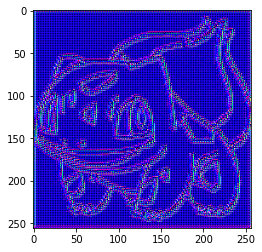

In [ ]:
# By the time we get here we MUST have shape(1, 256, 256, 3), even after all the DMI and AdaIn from the VGG

# TEST THE GENERATOR
gen_model_output = gen_model(sketch[tf.newaxis, ...], training=False)
#gen_model_output = tf.squeeze(gen_model_output, axis=0)
print(gen_model_output)

plt.imshow(gen_model_output[0, ...])

# **DEFINE GENERATOR LOSS**

In [ ]:
# GANs learn a loss that adapts to the data, while cGANs learn a structured loss that penalizes a possible structure that differs from the network output and the target image, as described in the pix2pix paper.

# The generator loss is a sigmoid cross-entropy loss of the generated images and an array of ones.
# The pix2pix paper also mentions the L1 loss, which is a MAE (mean absolute error) between the generated image and the target image.
# This allows the generated image to become structurally similar to the target image.
# The formula to calculate the total generator loss is gan_loss + LAMBDA * l1_loss, where LAMBDA = 100. This value was decided by the authors of the paper.

LAMBDA = 100

binCrossEnt = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output, gen_output, target):

    gan_loss = binCrossEnt(tf.ones_like(disc_generated_output), disc_generated_output)

    # Mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss


The training procedure for the generator is as follows:

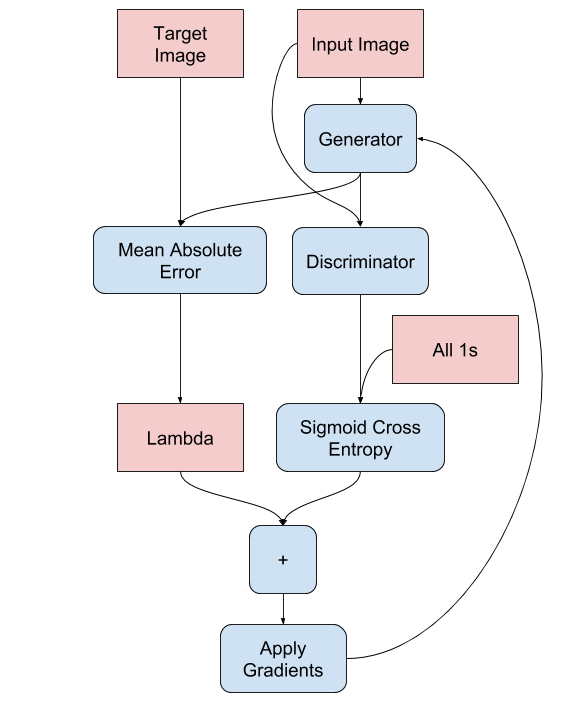

# **PATCH GAN DISCRIMINATOR MODEL**

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_9 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_7 (Concatenate)    (None, 256, 256, 6)  0           ['input_8[0][0]',                
                                                                  'input_9[0][0]']          

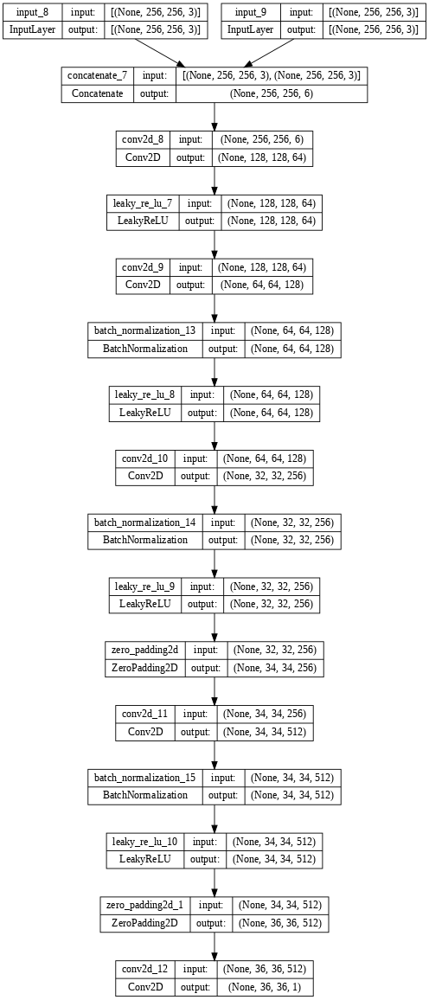

In [ ]:
# example of defining a 70x70 patchgan discriminator model
# functional API

# define the discriminator model
def define_discriminator(image_shape):
    # weight initialization
	#init = RandomNormal(stddev=0.02)
	init = tf.random_normal_initializer(0., 0.02)
	# source image input
	in_src_image = Input(shape=image_shape)
	# target image input
	in_target_image = Input(shape=image_shape)
	# concatenate images channel-wise
	merged = Concatenate()([in_src_image, in_target_image])
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init, use_bias=False)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)

	zero_pad1 = tf.keras.layers.ZeroPadding2D()(d)

	# C512
	d = Conv2D(512, (4,4), strides=(1,1), padding='same', kernel_initializer=init, use_bias=False)(zero_pad1)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
 
	zero_pad2 = tf.keras.layers.ZeroPadding2D()(d)
  
	# second last output layer
	# d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	# d = BatchNormalization()(d)
	# d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), strides=1, padding='same', kernel_initializer=init)(zero_pad2)
	#patch_out = Activation('sigmoid')(d)
	# define model
	model = Model([in_src_image, in_target_image], d)
	# compile model
	# opt = Adam(learning_rate=0.0002, beta_1=0.5)
	# model.compile(loss='binary_crossentropy', optimizer=opt, loss_weights=[0.5])
	return model

# define image shape
image_shape = (256,256,3)
# create the model
disc_model = define_discriminator(image_shape)
# summarize the model
disc_model.summary()
# plot the model
plot_model(disc_model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True, dpi=64)


# **TEST THE DISCRIMINATOR**

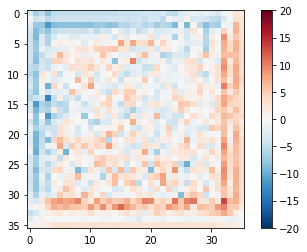

In [ ]:
# TEST THE DISCRIMINATOR
disc_output = disc_model([sketch[tf.newaxis, ...], gen_model_output], training=False)
plt.imshow(disc_output[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

# **DEFINE DISCRIMINATOR LOSS**

In [ ]:
# The discriminator_loss function takes 2 inputs: real images and generated images.
# real_loss is a sigmoid cross-entropy loss of the real images and an array of ones(since these are the real images).
# generated_loss is a sigmoid cross-entropy loss of the generated images and an array of zeros (since these are the fake images).
# The total_loss is the sum of real_loss and generated_loss.

def discriminator_loss(disc_real_output, disc_generated_output):

    real_loss = binCrossEnt(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = binCrossEnt(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss


The training procedure for the discriminator is shown below:

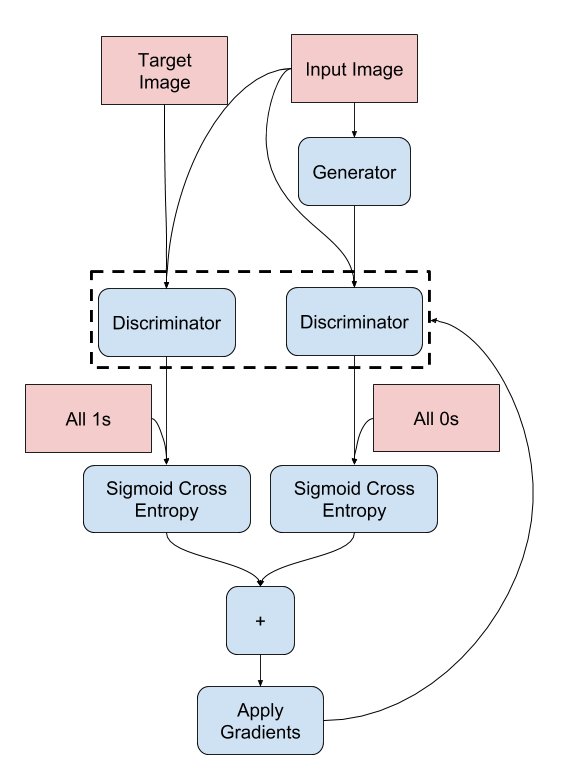

# **DEFINE OPTIMIZERS AND CHECKPOINT SAVER**

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=gen_model,
                                 discriminator=disc_model)

# **GENERATE IMAGES**

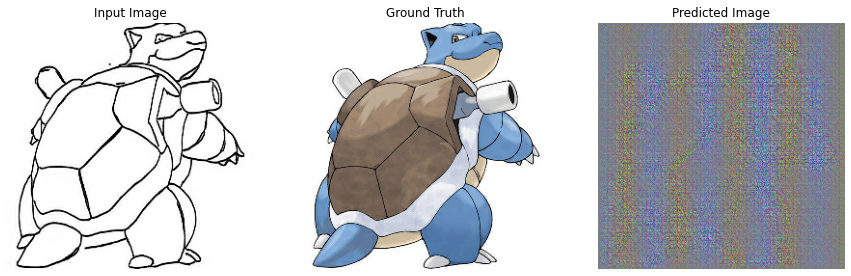

In [ ]:
def generate_images(model, test_input, tar):

    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))    
    display_list = [test_input[0], tar[0], prediction[0]]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']  

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])

        # Getting the pixel values in the [0, 1] range to plot.
        plt.imshow(display_list[i] * 0.5 + 0.5)
        plt.axis('off')

    plt.show()

# Test the above function
for example_input, example_target in test_dataset.take(1):
    generate_images(gen_model, example_input, example_target)

# **TRAINING**

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=summary_writer, histogram_freq=1)

@tf.function
def train_step(input_image, target, step):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_model_output = gen_model(input_image, training=True)

        disc_real_output = disc_model([input_image, target], training=True)
        disc_generated_output = disc_model([input_image, gen_model_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_model_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss, gen_model.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, disc_model.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, gen_model.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc_model.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
        tf.summary.scalar('disc_loss', disc_loss, step=step//1000)



# ACTUAL TRAINING
def fit(train_ds, test_ds, steps):
    example_input, example_target = next(iter(test_ds.take(1)))
    start = time.time()

    for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
        if (step) % 1000 == 0:
            display.clear_output(wait=True)

            if step != 0:
                print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

            start = time.time()

            generate_images(gen_model, example_input, example_target)
            print(f"Step: {step//1000}k")

        train_step(input_image, target, step)

        # Training step
        if (step+1) % 10 == 0:
            print('.', end='', flush=True)


        # Save (checkpoint) the model every 5k steps
        if (step + 1) % 5000 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

# **LAUNCH TENSORBOARD FOR VISUALIZATION**

In [ ]:
# # Load the TensorBoard notebook extension
# %load_ext tensorboard

# # Clear any logs from previous runs
!rm -rf ./logs/ 

#%reload_ext tensorboard


%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

# **RUN TRAINING LOOP**

Time taken for 1000 steps: 152.00 sec



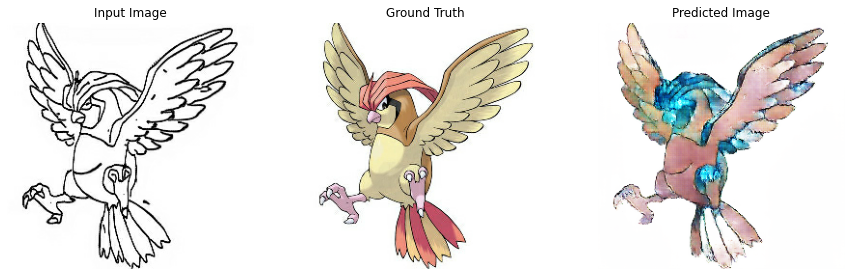

Step: 23k
.....................................

In [ ]:
fit(train_dataset, test_dataset, steps=1000)

#%tensorboard --logdir logs/fit

# **UPLOAD TENSORBOARD**

In [ ]:
# Caution: This command does not terminate. It's designed to continuously upload the results of long-running experiments.
# Once your data is uploaded you need to stop it using the "interrupt execution" option in your notebook tool.

# For publicly uploadingl logs to Tensorboard.dev
#tensorboard dev upload --logdir {log_dir}

# You can view the results of a previous run of this notebook on TensorBoard.dev.
# TensorBoard.dev is a managed experience for hosting, tracking, and sharing ML experiments with everyone.
# It can also included inline using an <iframe>:

# display.IFrame(
#     src="https://tensorboard.dev/experiment/lZ0C6FONROaUMfjYkVyJqw",
#     width="100%",
#     height="1000px")

# **RESTORE LATEST CHECKPOINT AND TEST NETWORK**

In [ ]:
!ls {checkpoint_dir}

# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

checkpoint		    ckpt-1.index		ckpt-2.index
ckpt-1.data-00000-of-00001  ckpt-2.data-00000-of-00001


# **GENERATE IMAGES USING TEST SET**

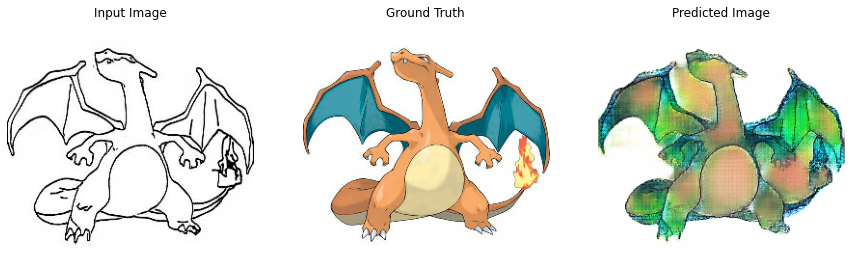

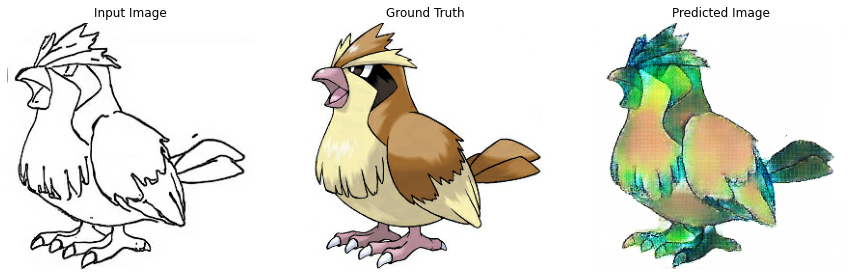

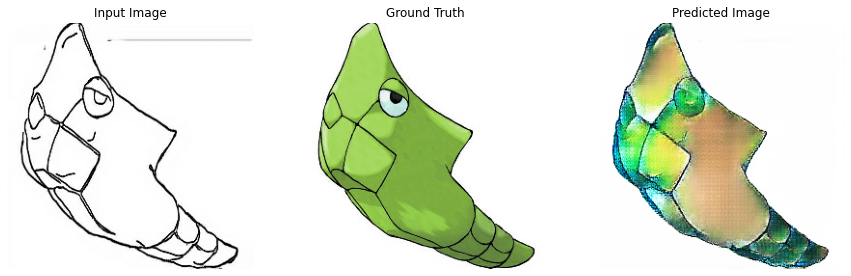

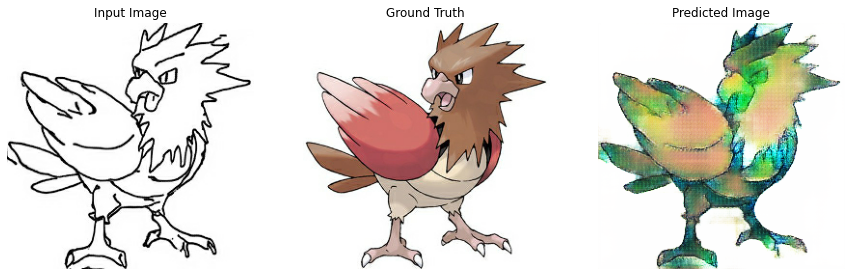

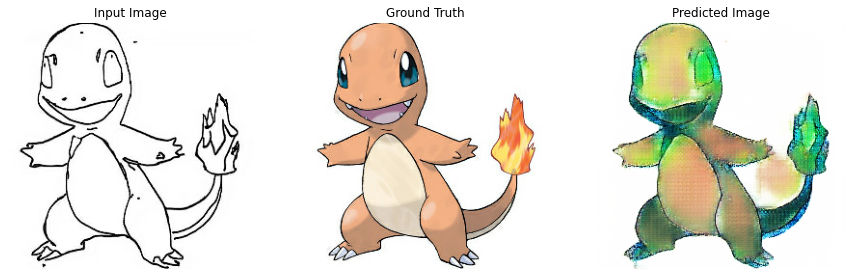

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
    generate_images(gen_model, inp, tar)

# **DEFINE GAN**

In [ ]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
	# make weights in the discriminator not trainable
	for layer in d_model.layers:
		if not isinstance(layer, BatchNormalization):
			layer.trainable = False
	# define the source image
	in_src = Input(shape=image_shape)
	# connect the source image to the generator input
	gen_out = g_model(in_src)
	# connect the source input and generator output to the discriminator input
	dis_out = d_model([in_src, gen_out])
	# src image as input, generated image and classification output
	model = Model(in_src, [dis_out, gen_out])
	# compile model
	opt = Adam(learning_rate=0.0002, beta_1=0.5)
	model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt, loss_weights=[1,100])
	return model

# **DEFINE COMPOSITE MODEL**

Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_26 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_14 (Functional)          (None, 256, 256, 3)  54424323    ['input_26[0][0]']               
                                                                                                  
 model_15 (Functional)          (None, 16, 16, 1)    6968257     ['input_26[0][0]',               
                                                                  'model_14[0][0]']               
                                                                                           

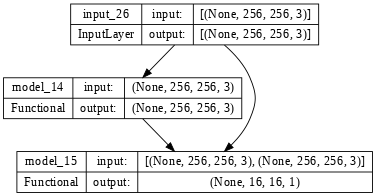

In [ ]:
# define image shape
image_shape = (256,256,3)
# define the models
g_model = define_generator(image_shape)
d_model = define_discriminator(image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, image_shape)
# summarize the model
gan_model.summary()
# plot the model
plot_model(gan_model, to_file='gan_model_plot.png', show_shapes=True, show_layer_names=True, dpi=64)